In [1]:
#234567890#234567890#234567890#234567890#234567890#234567890#234567890#23456789
import ImageMagick
using Images
using PlutoUI
using HypertextLiteral

### Ex 1

In [2]:
rv = [rand() for r in 1:10]
rv

10-element Vector{Float64}:
 0.1710571626739933
 0.17901149312643905
 0.44196728319345113
 0.2334115193284929
 0.9619348612880858
 0.9060255969853217
 0.6213936931227911
 0.715684822077061
 0.28764354167292294
 0.021496127784675245

In [3]:
function my_sum(v)
    s = 0
    for i in v
        s = s + i
    end
    s
end

my_sum (generic function with 1 method)

In [4]:
my_sum(rv)

4.5396261012532335

In [5]:
sum(rv)

4.5396261012532335

In [6]:
function mean(v)
    my_sum(v) / length(v)
end

mean (generic function with 1 method)

In [7]:
m = mean(rv)
m

0.45396261012532335

In [8]:
function deviation(v)
    m = mean(v)
    v .- m
end

deviation (generic function with 1 method)

In [9]:
deviation(rv)

10-element Vector{Float64}:
 -0.28290544745133006
 -0.2749511169988843
 -0.011995326931872219
 -0.22055109079683044
  0.5079722511627625
  0.45206298685999835
  0.16743108299746778
  0.2617222119517376
 -0.1663190684524004
 -0.4324664823406481

In [10]:
test_v = [-1., -1.5, 8.5]
mean(test_v)

2.0

In [11]:
deviation(test_v)

3-element Vector{Float64}:
 -3.0
 -3.5
  6.5

In [12]:
mean(deviation(test_v))

0.0

In [13]:
function create_bar()
    v = zeros(100)
    v[40:60] .= 1
    v
end

create_bar (generic function with 1 method)

In [14]:
create_bar()

100-element Vector{Float64}:
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 ⋮
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

### Ex 2

In [15]:
url = (
    "https://user-images.githubusercontent.com/6933510/"
    * "107239146-dcc3fd00-6a28-11eb-8c7b-41aaf6618935.png")
philip_filename = download(url)

"/var/folders/41/jhvt_zmd3nz3x5jsqblr221r0000gn/T/jl_ka3n9E/107239146-dcc3fd00-6a28-11eb-8c7b-41aaf6618935.png"

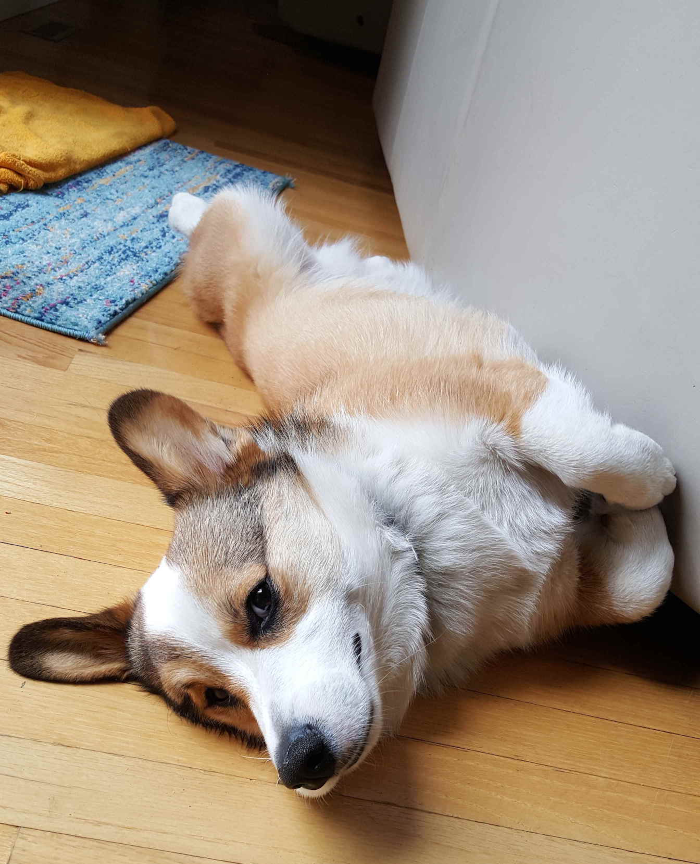

In [16]:
philip = load(philip_filename)

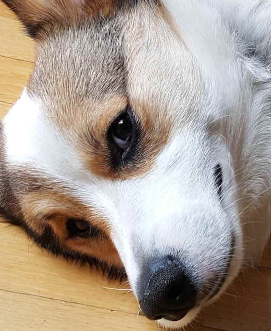

In [17]:
p_head = philip[470:800, 140:410]
p_head

In [18]:
typeof(philip)

Matrix{RGB{N0f8}} (alias for Array{RGB{Normed{UInt8, 8}}, 2})

In [19]:
function get_channel_value(pixel, channel)
    if channel == "r"
        return pixel.r
    elseif channel == "g"
        return pixel.g        
    elseif channel == "b"
        return pixel.b
    end
end

get_channel_value (generic function with 1 method)

In [20]:
get_channel_value(RGB(0.8, 0.1, 0.0), "r")

0.8

In [21]:
function get_channel_values(image, channel)
    #[pixel.r for pixel in image]
    get_channel_value.(image, channel)
end

get_channel_values (generic function with 1 method)

In [22]:
get_channel_values(p_head, "r")

331×271 Array{N0f8,2} with eltype N0f8:
 0.647  0.482  0.325  0.22   0.243  …  0.863  0.82   0.863  0.918  0.875
 0.686  0.682  0.51   0.247  0.235     0.816  0.808  0.902  0.875  0.898
 0.894  0.765  0.612  0.467  0.376     0.824  0.902  0.824  0.894  0.882
 0.824  0.804  0.788  0.741  0.541     0.89   0.882  0.918  0.914  0.886
 0.867  0.851  0.824  0.765  0.651     0.878  0.878  0.875  0.843  0.843
 0.82   0.792  0.769  0.761  0.8    …  0.831  0.906  0.824  0.835  0.835
 0.824  0.816  0.824  0.847  0.859     0.855  0.855  0.855  0.835  0.875
 0.827  0.82   0.82   0.804  0.773     0.824  0.827  0.847  0.882  0.894
 0.831  0.827  0.82   0.796  0.788     0.847  0.859  0.882  0.894  0.882
 0.839  0.831  0.827  0.812  0.824     0.859  0.859  0.871  0.886  0.89
 0.827  0.843  0.843  0.792  0.816  …  0.902  0.886  0.894  0.898  0.906
 0.867  0.827  0.816  0.851  0.855     0.898  0.882  0.894  0.906  0.902
 0.871  0.863  0.843  0.827  0.847     0.882  0.89   0.894  0.886  0.863
 ⋮          

In [23]:
function value_as_color(x, channel)
    if channel == "r"
        return RGB(x, 0, 0)
    elseif channel == "g"
        return RGB(0, x, 0)
    elseif channel == "b"
        return RGB(0, 0, x)
    end
end

value_as_color (generic function with 1 method)

In [24]:
value_as_color(0.6, "r")

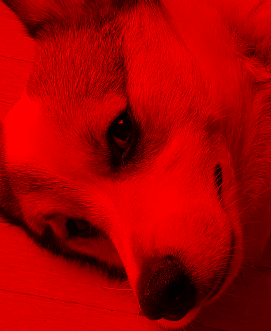

In [25]:
value_as_color.(get_channel_values.(p_head, "r"), "r")

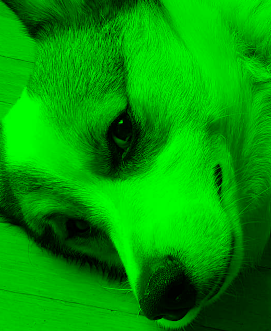

In [26]:
value_as_color.(get_channel_values.(p_head, "g"), "g")

In [27]:
function mean_color(img)
    meanr = mean(get_channel_values.(img, "r"))
    meang = mean(get_channel_values.(img, "g"))
    meanb = mean(get_channel_values.(img, "b"))
    RGB(meanr, meang, meanb)
end

mean_color (generic function with 1 method)

In [28]:
mean_color(p_head)

In [29]:
mean_color(p_head[1:50, 1:50])

### Ex 3

In [30]:
function invert(color::AbstractRGB)
    RGB(1 - color.r, 1 - color.g, 1 - color.b)
end

invert (generic function with 1 method)

In [31]:
red = RGB(1., 0., 0.)
red

In [32]:
invert(red)

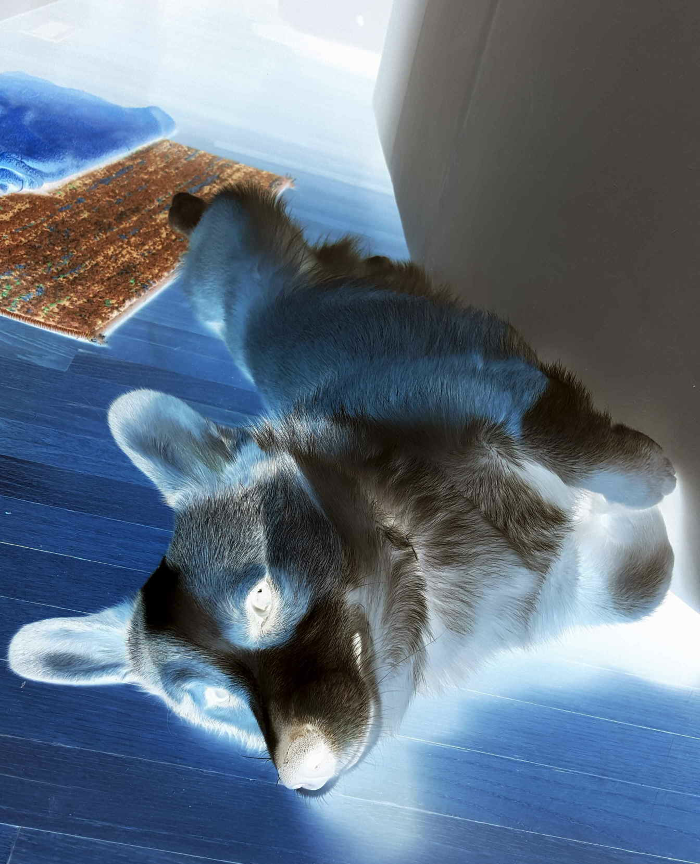

In [33]:
invert.(philip)

In [34]:
function quantize(x::Number)
    # x should be on [0, 1]
    floor(10x) / 10
end

quantize (generic function with 1 method)

In [35]:
quantize(0.267), quantize(0.91)

(0.2, 0.9)

In [36]:
function double(x::Number)
    2x
end

double (generic function with 1 method)

In [37]:
function double(v::Vector)
    2 .* v
end

double (generic function with 2 methods)

In [38]:
double(12)

24

In [39]:
double([1, 2, 3, 5])

4-element Vector{Int64}:
  2
  4
  6
 10

In [45]:
function quantize(color::AbstractRGB)
    RGB(quantize(color.r), quantize(color.g), quantize(color.b))
end

quantize (generic function with 2 methods)

In [48]:
color = RGB(0.24, 0.58, 0.94)
color

In [49]:
quantize(color)

In [50]:
function quantize(image::AbstractMatrix)
    quantize.(image)
end

quantize (generic function with 3 methods)

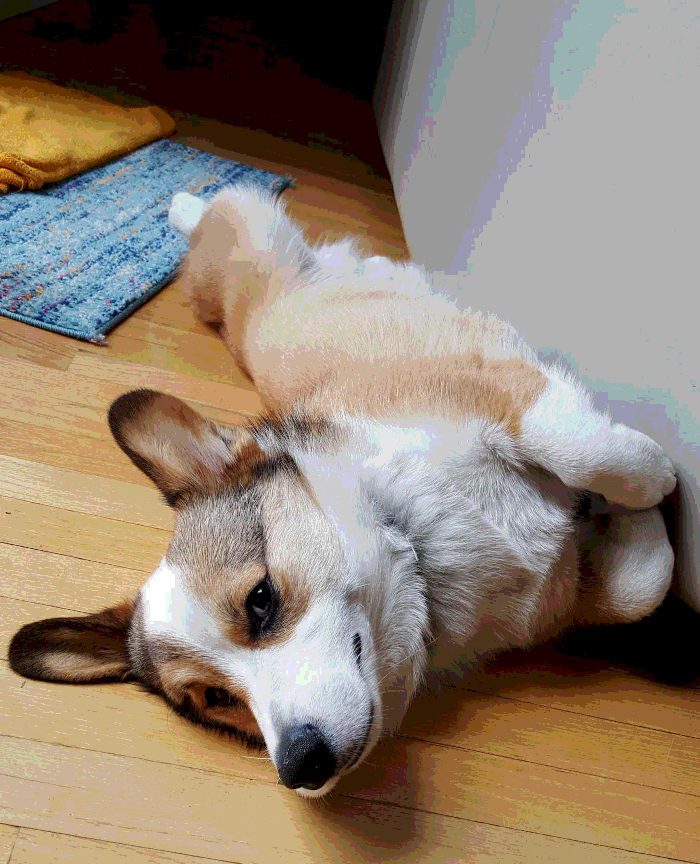

In [51]:
quantize(philip)

In [71]:
function noisify(x::Number, s)
    clamp(rand(x - s:0.01:x + s), 0..1)
end

noisify (generic function with 1 method)

In [77]:
noisify(0.5, 0.1)

0.58

In [82]:
function noisify(color::AbstractRGB, s)
    RGB(noisify(color.r, s), noisify(color.g, s), noisify(color.b, s))
end

noisify (generic function with 2 methods)

In [90]:
[
    noisify(color, 0.1), noisify(color, 0.2), noisify(color, 0.4), 
    noisify(color, 0.8)
]

In [91]:
[
    noisify(color, 0.1), noisify(color, 0.2), noisify(color, 0.4), 
    noisify(color, 0.8)
]

In [94]:
function noisify(image::AbstractMatrix, s)
    noisify.(image, s)
end

noisify (generic function with 3 methods)

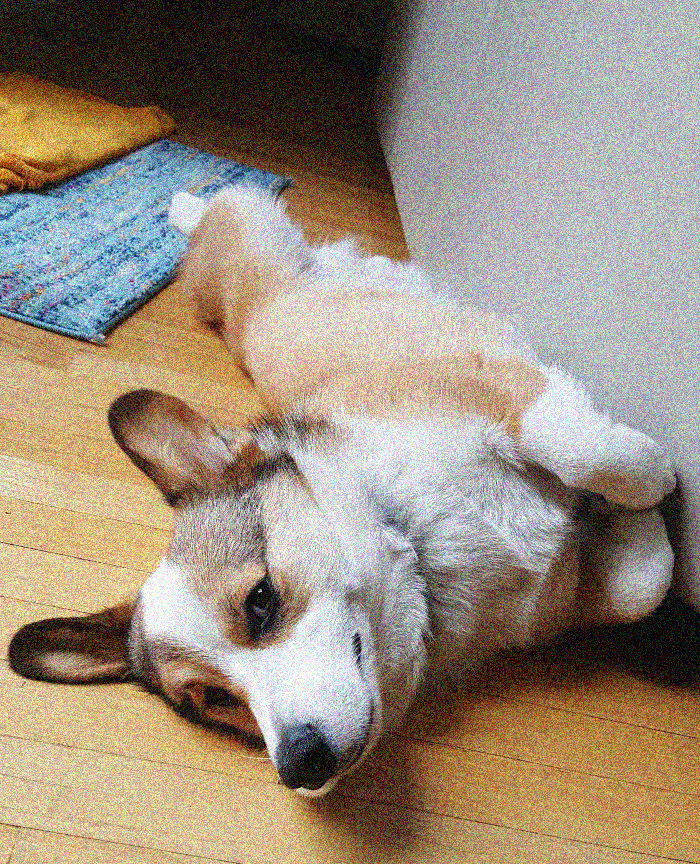

In [95]:
noisify(philip, 0.2)

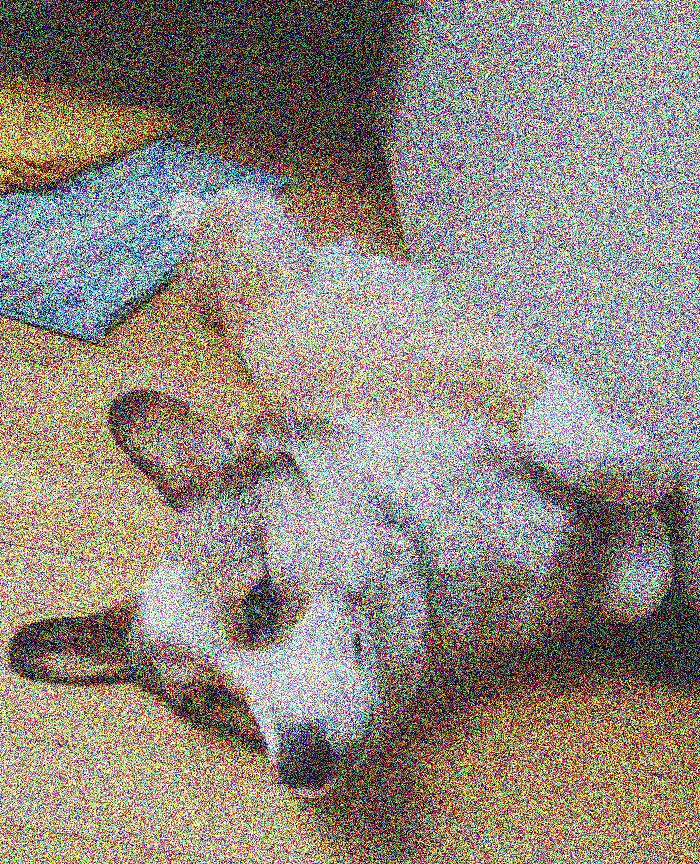

In [97]:
noisify(philip, 0.8)